In [1]:
#Imports

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import matplotlib as mp

%matplotlib inline 

import math
import random 
from datetime import timedelta

import seaborn as sns
    
import warnings
warnings.filterwarnings('ignore')

In [2]:
palet = ['#33246f','#1df2c9','#c245be','#f8ff20','#ef7433','#73C6B6','#A93226','#5ADCE3','#F550D5','#000000']

In [3]:
# import dataset
df = pd.read_csv("assets/crypto-markets.csv", parse_dates=["date"])
df

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
0,bitcoin,BTC,Bitcoin,2013-04-28,1,135.30,135.98,132.10,134.21,0.0,1.488567e+09,0.5438,3.88
1,bitcoin,BTC,Bitcoin,2013-04-29,1,134.44,147.49,134.00,144.54,0.0,1.603769e+09,0.7813,13.49
2,bitcoin,BTC,Bitcoin,2013-04-30,1,144.00,146.93,134.05,139.00,0.0,1.542813e+09,0.3843,12.88
3,bitcoin,BTC,Bitcoin,2013-05-01,1,139.00,139.89,107.72,116.99,0.0,1.298955e+09,0.2882,32.17
4,bitcoin,BTC,Bitcoin,2013-05-02,1,116.38,125.60,92.28,105.21,0.0,1.168517e+09,0.3881,33.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...
942292,project-x,NANOX,Project-X,2018-11-26,1727,22424.60,23049.30,17607.50,20724.80,143.0,1.622000e+03,0.5728,5441.80
942293,project-x,NANOX,Project-X,2018-11-27,1727,20711.90,23742.10,19292.90,23298.70,637.0,1.823000e+03,0.9003,4449.20
942294,project-x,NANOX,Project-X,2018-11-28,1727,23320.90,25235.10,19888.10,24442.70,49.0,1.913000e+03,0.8518,5347.00
942295,project-x,NANOX,Project-X,2018-11-29,1727,24543.53,24582.47,21457.95,22839.44,153.0,1.788000e+03,0.4421,3124.52


In [4]:
df_list = ['bitcoin','litecoin','tether','monero','stellar','ripple','nem','dash','ethereum','neo']

In [5]:
# Get 10 coins
df = df.loc[df['slug'].isin(df_list)].reset_index(drop=True)
df

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
0,bitcoin,BTC,Bitcoin,2013-04-28,1,135.30,135.98,132.10,134.21,0.0,1.488567e+09,0.5438,3.88
1,bitcoin,BTC,Bitcoin,2013-04-29,1,134.44,147.49,134.00,144.54,0.0,1.603769e+09,0.7813,13.49
2,bitcoin,BTC,Bitcoin,2013-04-30,1,144.00,146.93,134.05,139.00,0.0,1.542813e+09,0.3843,12.88
3,bitcoin,BTC,Bitcoin,2013-05-01,1,139.00,139.89,107.72,116.99,0.0,1.298955e+09,0.2882,32.17
4,bitcoin,BTC,Bitcoin,2013-05-02,1,116.38,125.60,92.28,105.21,0.0,1.168517e+09,0.3881,33.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15735,neo,NEO,NEO,2018-11-25,17,7.48,7.95,6.73,7.71,168973000.0,5.012066e+08,0.8033,1.22
15736,neo,NEO,NEO,2018-11-26,17,7.69,7.88,6.89,7.14,129336000.0,4.638166e+08,0.2525,0.99
15737,neo,NEO,NEO,2018-11-27,17,7.12,7.30,6.78,7.26,126595000.0,4.718519e+08,0.9231,0.52
15738,neo,NEO,NEO,2018-11-28,17,7.25,8.73,7.25,8.39,175504000.0,5.451414e+08,0.7703,1.48


In [6]:
# row - column numbers
df.shape

(15740, 13)

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15740 entries, 0 to 15739
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   slug         15740 non-null  object        
 1   symbol       15740 non-null  object        
 2   name         15740 non-null  object        
 3   date         15740 non-null  datetime64[ns]
 4   ranknow      15740 non-null  int64         
 5   open         15740 non-null  float64       
 6   high         15740 non-null  float64       
 7   low          15740 non-null  float64       
 8   close        15740 non-null  float64       
 9   volume       15740 non-null  float64       
 10  market       15740 non-null  float64       
 11  close_ratio  15740 non-null  float64       
 12  spread       15740 non-null  float64       
dtypes: datetime64[ns](1), float64(8), int64(1), object(3)
memory usage: 1.6+ MB


In [8]:
df.describe()

,ranknow,open,high,low,close,volume,market,close_ratio,spread
count,15740.000000,15740.000000,15740.000000,15740.000000,15740.000000,1.574000e+04,1.574000e+04,15740.000000,15740.000000
mean,7.477319,338.028597,348.815607,325.842305,338.272077,3.792959e+08,8.075902e+09,0.478446,22.973211
std,5.242496,1454.384542,1504.970893,1393.738241,1454.607933,1.337665e+09,2.620039e+10,0.313277,137.837483
min,1.000000,0.000086,0.000089,0.000079,0.000086,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,2.000000,0.202074,0.209639,0.192200,0.202577,1.467545e+05,2.900165e+07,0.204975,0.000000
50%,7.000000,2.310000,2.420000,2.200000,2.310000,5.467690e+06,3.178864e+08,0.468150,0.110000
75%,11.000000,85.642500,89.137500,82.075000,85.767500,9.087137e+07,3.626360e+09,0.754300,4.420000
max,17.000000,19475.800000,20089.000000,18974.100000,19497.400000,2.384090e+10,3.265025e+11,1.000000,4110.400000


In [9]:
df.groupby('slug').size() 

slug
bitcoin     2042
dash        1750
ethereum    1211
litecoin    2042
monero      1653
nem         1339
neo          812
ripple      1944
stellar     1578
tether      1369
dtype: int64

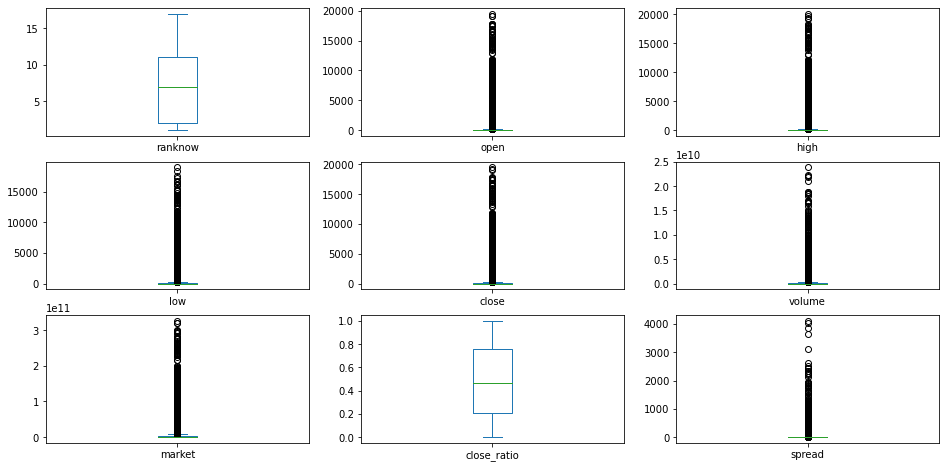

In [10]:
# box and whisker plots
df.plot(kind='box', subplots=True, layout=(3,3), sharex=False, sharey=False,figsize=(16,8))
plt.show()

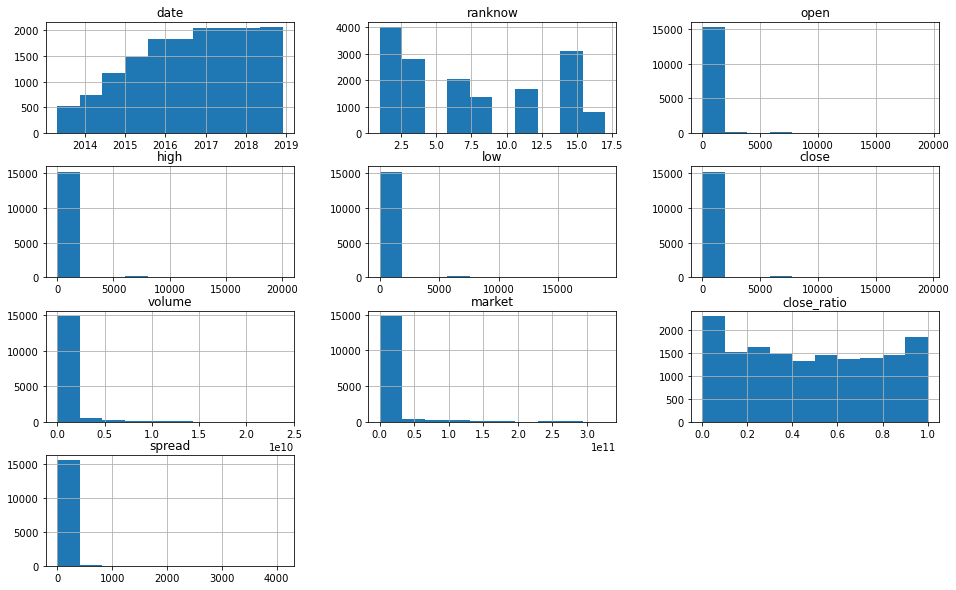

In [11]:
# histograms
df.hist(figsize=(16,10))
plt.show()

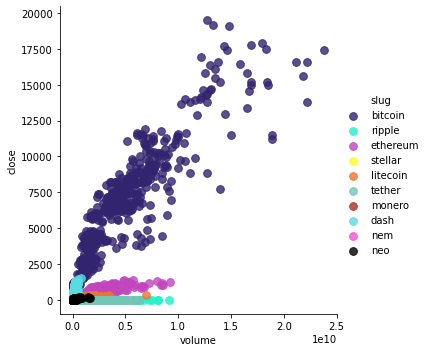

In [12]:
sns.lmplot('volume','close', data=df, hue='slug', palette=palet,fit_reg=False, scatter_kws={"s":60})

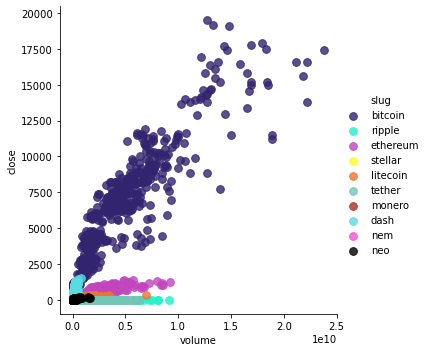

In [13]:
sns.lmplot('volume','close', data=df, hue='slug', palette=palet,fit_reg=False, scatter_kws={"s":60})

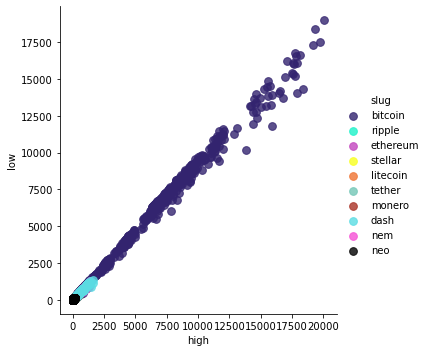

In [14]:
sns.lmplot('high','low', data=df, hue='slug', palette=palet,fit_reg=False, scatter_kws={"s":60})

In [15]:
df.groupby('slug').mean()

,ranknow,open,high,low,close,volume,market,close_ratio,spread
slug,,,,,,,,,
bitcoin,1.0,2285.455421,2354.447723,2207.495544,2287.287272,1.450143e+09,3.785297e+10,0.541097,146.952179
dash,14.0,123.697473,129.493002,117.363270,123.718895,4.156477e+07,9.643054e+08,0.489310,12.129749
ethereum,3.0,213.387777,221.743197,203.704500,213.405995,8.544199e+08,2.079110e+10,0.517017,18.038695
litecoin,7.0,31.121161,32.520083,29.555940,31.123751,1.383520e+08,1.634127e+09,0.491868,2.964143
monero,11.0,54.040201,56.680063,51.071471,54.059443,2.221027e+07,8.438307e+08,0.503835,5.608554
nem,15.0,0.129359,0.137557,0.119855,0.129235,1.224149e+07,1.163226e+09,0.489201,0.017528
neo,17.0,29.478534,31.178139,27.436513,29.471865,9.282185e+07,1.860486e+09,0.501199,3.741675
ripple,2.0,0.163341,0.172868,0.153472,0.163552,1.981335e+08,6.291193e+09,0.474768,0.019110
stellar,4.0,0.072297,0.076556,0.067752,0.072384,2.955188e+07,1.296090e+09,0.480232,0.008466


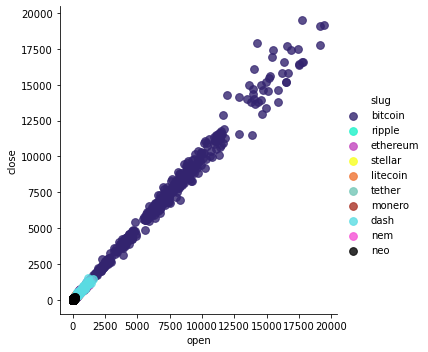

In [16]:
sns.lmplot('open','close', data=df, hue='slug', palette=palet,fit_reg=False, scatter_kws={"s":60})
plt.show()

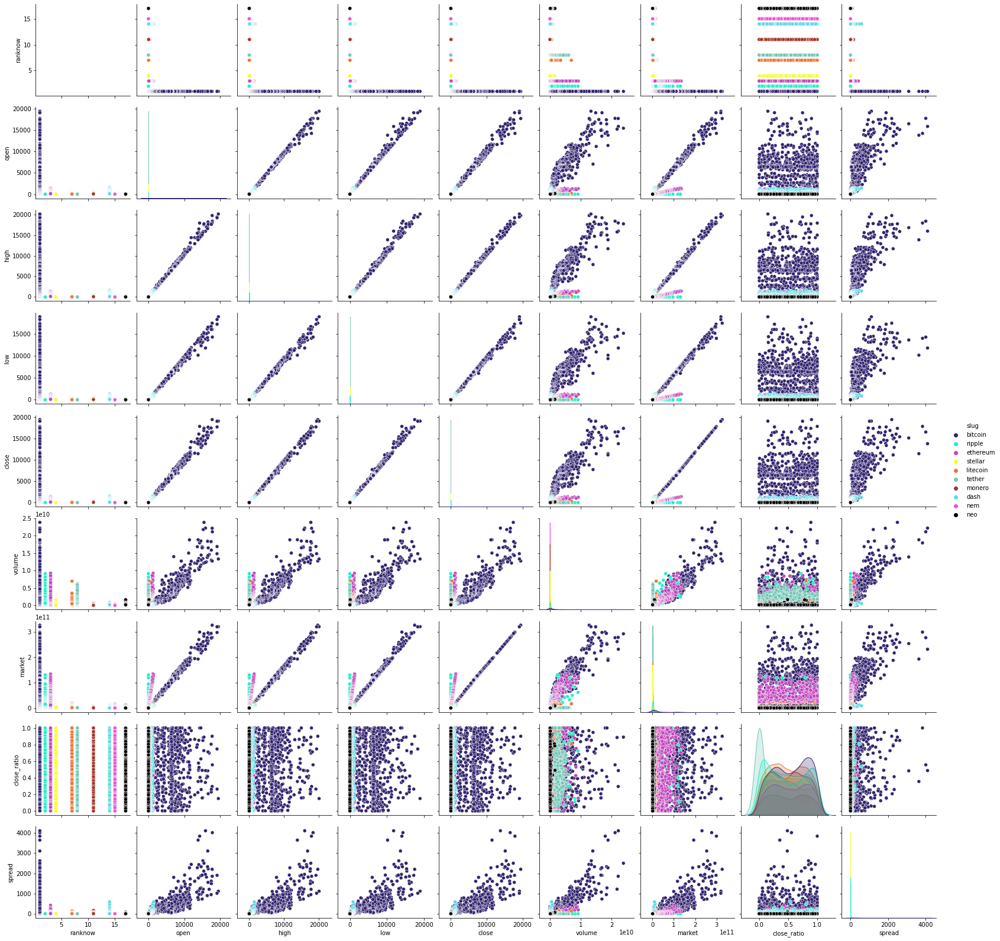

In [17]:
sns.pairplot(df, hue='slug',palette=palet)

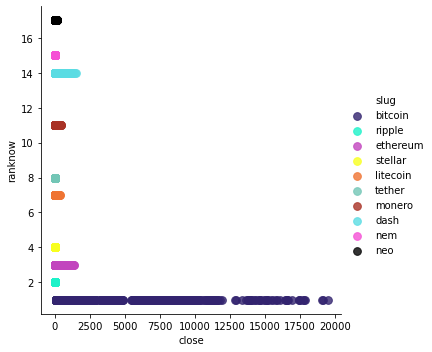

In [18]:
sns.lmplot('close','ranknow', data=df, hue='slug', palette=palet,fit_reg=False, scatter_kws={"s":60})
plt.show()


In [19]:
fig = px.scatter(df, x = 'close', y = 'name', 
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(showlegend = True)

fig.show()

In [20]:
fig = px.scatter(df, x = 'volume', y = 'name', 
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(showlegend = True)

fig.show()

In [21]:
fig = px.scatter(df, x = 'market', y = 'name', 
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(showlegend = True)

In [22]:
fig = px.scatter(df, x = 'spread', y = 'name', 
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(showlegend = True)

In [23]:
fig = px.scatter(df, x = 'market', y = 'close', 
                 color = 'slug', height = 400, width = 800,color_discrete_sequence=palet)

fig.update_layout(showlegend = True)

fig.show()

In [24]:
fig = px.scatter(df, x = 'volume', y = 'close', 
                 color = 'slug', height = 400, width = 800,color_discrete_sequence=palet)
fig.update_layout(showlegend = True)

fig.show()

In [25]:
fig = px.scatter(df, x = 'close', y = 'spread', 
                 color = 'slug', height = 400, width = 800,color_discrete_sequence=palet)

fig.update_layout(showlegend = True)

fig.show()

In [26]:
fig = make_subplots(rows=2, cols=3, subplot_titles=('Bitcoin','Ripple','Ethereum','Litecoin','Dash'),shared_xaxes = False, horizontal_spacing = 0.14, vertical_spacing = 0.2)

fig_a= px.scatter(df[df['slug']=='bitcoin'], x='close', y='spread', trendline="ols", color_discrete_sequence=['#33246f'])
fig_b= px.scatter(df[df['slug']=='ripple'], x='close', y='spread', trendline="ols", color_discrete_sequence=['#1df2c9'])
fig_c= px.scatter(df[df['slug']=='ethereum'], x='close', y='spread', trendline="ols", color_discrete_sequence=['#c245be'])
fig_d = px.scatter(df[df['slug']=='litecoin'], x='close', y='spread', trendline="ols", color_discrete_sequence=['#f8ff20'])
fig_e = px.scatter(df[df['slug']=='dash'], x='close', y='spread', trendline="ols", color_discrete_sequence=['#ef7433'])
figa_traces = []
figb_traces = []
figc_traces = []
figd_traces = []
fige_traces = []
for trace in range(len(fig_a["data"])):
    figa_traces.append(fig_a["data"][trace])
for trace in range(len(fig_b["data"])):
    figb_traces.append(fig_b["data"][trace])
for trace in range(len(fig_c["data"])):
    figc_traces.append(fig_c["data"][trace])
for trace in range(len(fig_d["data"])):
    figd_traces.append(fig_d["data"][trace])
for trace in range(len(fig_e["data"])):
    fige_traces.append(fig_e["data"][trace])

for traces in figa_traces:
    fig.append_trace(traces, row=1, col=1)
for traces in figb_traces:
    fig.append_trace(traces, row=1, col=2)
for traces in figc_traces:
    fig.append_trace(traces, row=1, col=3)
for traces in figd_traces:
    fig.append_trace(traces, row=2, col=1)
for traces in fige_traces:
    fig.append_trace(traces, row=2, col=2)
    
fig.update_layout(height=500, width=1000)
fig.show()


In [27]:
fig = px.scatter(df, x = 'volume', y = 'spread', 
                 color = 'slug', height = 400, width = 800,color_discrete_sequence=palet)

fig.update_layout(showlegend = True)

fig.show()

In [28]:
fig = make_subplots(rows=2, cols=3, subplot_titles=('Bitcoin','Ripple','Ethereum','Litecoin','Dash'),shared_xaxes = False, horizontal_spacing = 0.14, vertical_spacing = 0.2)

fig_a= px.scatter(df[df['slug']=='bitcoin'], x='volume', y='spread', trendline="ols", color_discrete_sequence=['#33246f'])
fig_b= px.scatter(df[df['slug']=='ripple'], x='volume', y='spread', trendline="ols", color_discrete_sequence=['#1df2c9'])
fig_c= px.scatter(df[df['slug']=='ethereum'], x='volume', y='spread', trendline="ols", color_discrete_sequence=['#c245be'])
fig_d = px.scatter(df[df['slug']=='litecoin'], x='volume', y='spread', trendline="ols", color_discrete_sequence=['#f8ff20'])
fig_e = px.scatter(df[df['slug']=='dash'], x='volume', y='spread', trendline="ols", color_discrete_sequence=['#ef7433'])
figa_traces = []
figb_traces = []
figc_traces = []
figd_traces = []
fige_traces = []
for trace in range(len(fig_a["data"])):
    figa_traces.append(fig_a["data"][trace])
for trace in range(len(fig_b["data"])):
    figb_traces.append(fig_b["data"][trace])
for trace in range(len(fig_c["data"])):
    figc_traces.append(fig_c["data"][trace])
for trace in range(len(fig_d["data"])):
    figd_traces.append(fig_d["data"][trace])
for trace in range(len(fig_e["data"])):
    fige_traces.append(fig_e["data"][trace])

for traces in figa_traces:
    fig.append_trace(traces, row=1, col=1)
for traces in figb_traces:
    fig.append_trace(traces, row=1, col=2)
for traces in figc_traces:
    fig.append_trace(traces, row=1, col=3)
for traces in figd_traces:
    fig.append_trace(traces, row=2, col=1)
for traces in fige_traces:
    fig.append_trace(traces, row=2, col=2)
    
fig.update_layout(height=500, width=1000)
fig.show()


In [29]:
fig = make_subplots(rows=2, cols=5, subplot_titles=('bitcoin','litecoin','tether','monero','stellar','ripple','nem','dash','ethereum','neo'),shared_xaxes = False, horizontal_spacing = 0.14, vertical_spacing = 0.2)

fig_a= px.scatter(df[df['slug']=='bitcoin'], x='market', y='close', trendline="ols", color_discrete_sequence=['#33246f'])
fig_b= px.scatter(df[df['slug']=='litecoin'], x='market', y='close', trendline="ols", color_discrete_sequence=['#1df2c9'])
fig_c= px.scatter(df[df['slug']=='tether'], x='market', y='close', trendline="ols", color_discrete_sequence=['#c245be'])
fig_d = px.scatter(df[df['slug']=='monero'], x='market', y='close', trendline="ols", color_discrete_sequence=['#f8ff20'])
fig_e = px.scatter(df[df['slug']=='stellar'], x='market', y='close', trendline="ols", color_discrete_sequence=['#ef7433'])
fig_f= px.scatter(df[df['slug']=='ripple'], x='market', y='close', trendline="ols", color_discrete_sequence=['#73C6B6'])
fig_g= px.scatter(df[df['slug']=='nem'], x='market', y='close', trendline="ols", color_discrete_sequence=['#A93226'])
fig_h= px.scatter(df[df['slug']=='dash'], x='market', y='close', trendline="ols", color_discrete_sequence=['#5ADCE3'])
fig_i = px.scatter(df[df['slug']=='ethereum'], x='market', y='close', trendline="ols", color_discrete_sequence=['#F550D5'])
fig_j = px.scatter(df[df['slug']=='neo'], x='market', y='close', trendline="ols", color_discrete_sequence=['#000000'])
figa_traces = []
figb_traces = []
figc_traces = []
figd_traces = []
fige_traces = []
figf_traces = []
figg_traces = []
figh_traces = []
figi_traces = []
figj_traces = []


for trace in range(len(fig_a["data"])):
    figa_traces.append(fig_a["data"][trace])
for trace in range(len(fig_b["data"])):
    figb_traces.append(fig_b["data"][trace])
for trace in range(len(fig_c["data"])):
    figc_traces.append(fig_c["data"][trace])
for trace in range(len(fig_d["data"])):
    figd_traces.append(fig_d["data"][trace])
for trace in range(len(fig_e["data"])):
    fige_traces.append(fig_e["data"][trace])
for trace in range(len(fig_f["data"])):
    figf_traces.append(fig_f["data"][trace])
for trace in range(len(fig_g["data"])):
    figg_traces.append(fig_g["data"][trace])
for trace in range(len(fig_h["data"])):
    figh_traces.append(fig_h["data"][trace])
for trace in range(len(fig_i["data"])):
    figi_traces.append(fig_i["data"][trace])
for trace in range(len(fig_j["data"])):
    figj_traces.append(fig_j["data"][trace])

for traces in figa_traces:
    fig.append_trace(traces, row=1, col=1)
for traces in figb_traces:
    fig.append_trace(traces, row=1, col=2)
for traces in figc_traces:
    fig.append_trace(traces, row=1, col=3)
for traces in figd_traces:
    fig.append_trace(traces, row=1, col=4)
for traces in fige_traces:
    fig.append_trace(traces, row=1, col=5)
for traces in figf_traces:
    fig.append_trace(traces, row=2, col=1)
for traces in figg_traces:
    fig.append_trace(traces, row=2, col=2)
for traces in figh_traces:
    fig.append_trace(traces, row=2, col=3)
for traces in figi_traces:
    fig.append_trace(traces, row=2, col=4)
for traces in figj_traces:
    fig.append_trace(traces, row=2, col=5)
    
fig.update_layout(height=500, width=1200)
fig.show()


In [30]:
fig = make_subplots(rows=2, cols=5, subplot_titles=('bitcoin','litecoin','tether','monero','stellar','ripple','nem','dash','ethereum','neo'),shared_xaxes = False, horizontal_spacing = 0.14, vertical_spacing = 0.2)

fig_a= px.scatter(df[df['slug']=='bitcoin'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#33246f'])
fig_b= px.scatter(df[df['slug']=='litecoin'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#1df2c9'])
fig_c= px.scatter(df[df['slug']=='tether'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#c245be'])
fig_d = px.scatter(df[df['slug']=='monero'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#f8ff20'])
fig_e = px.scatter(df[df['slug']=='stellar'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#ef7433'])
fig_f= px.scatter(df[df['slug']=='ripple'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#73C6B6'])
fig_g= px.scatter(df[df['slug']=='nem'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#A93226'])
fig_h= px.scatter(df[df['slug']=='dash'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#5ADCE3'])
fig_i = px.scatter(df[df['slug']=='ethereum'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#F550D5'])
fig_j = px.scatter(df[df['slug']=='neo'], x='volume', y='close', trendline="ols", color_discrete_sequence=['#000000'])
figa_traces = []
figb_traces = []
figc_traces = []
figd_traces = []
fige_traces = []
figf_traces = []
figg_traces = []
figh_traces = []
figi_traces = []
figj_traces = []


for trace in range(len(fig_a["data"])):
    figa_traces.append(fig_a["data"][trace])
for trace in range(len(fig_b["data"])):
    figb_traces.append(fig_b["data"][trace])
for trace in range(len(fig_c["data"])):
    figc_traces.append(fig_c["data"][trace])
for trace in range(len(fig_d["data"])):
    figd_traces.append(fig_d["data"][trace])
for trace in range(len(fig_e["data"])):
    fige_traces.append(fig_e["data"][trace])
for trace in range(len(fig_f["data"])):
    figf_traces.append(fig_f["data"][trace])
for trace in range(len(fig_g["data"])):
    figg_traces.append(fig_g["data"][trace])
for trace in range(len(fig_h["data"])):
    figh_traces.append(fig_h["data"][trace])
for trace in range(len(fig_i["data"])):
    figi_traces.append(fig_i["data"][trace])
for trace in range(len(fig_j["data"])):
    figj_traces.append(fig_j["data"][trace])

for traces in figa_traces:
    fig.append_trace(traces, row=1, col=1)
for traces in figb_traces:
    fig.append_trace(traces, row=1, col=2)
for traces in figc_traces:
    fig.append_trace(traces, row=1, col=3)
for traces in figd_traces:
    fig.append_trace(traces, row=1, col=4)
for traces in fige_traces:
    fig.append_trace(traces, row=1, col=5)
for traces in figf_traces:
    fig.append_trace(traces, row=2, col=1)
for traces in figg_traces:
    fig.append_trace(traces, row=2, col=2)
for traces in figh_traces:
    fig.append_trace(traces, row=2, col=3)
for traces in figi_traces:
    fig.append_trace(traces, row=2, col=4)
for traces in figj_traces:
    fig.append_trace(traces, row=2, col=5)
    
fig.update_layout(height=500, width=1200)
fig.show()


In [31]:
fig = px.scatter(df, x = 'volume', y = 'market', 
                 color = 'slug', height = 400, width = 800,color_discrete_sequence=palet)

fig.update_layout(showlegend = True)

fig.show()

In [32]:
fig = px.line(df, x = 'date', y = 'close', color = 'slug', height = 400,width = 800,
                color_discrete_sequence = palet)
fig.show()

In [33]:
fig = make_subplots(rows = 2, cols = 3, shared_xaxes = False, horizontal_spacing = 0.14, 
                    vertical_spacing = 0.2, subplot_titles = ('2013', '2014','2015', '2016','2017', '2018'))
for i in range(6):
    slug_df = df.set_index('date')
    slug_df = slug_df[slug_df.index.year==2013+i]
    slug_df = slug_df.groupby('slug').mean()
    slug_df = slug_df.sort_values('close')
    fig_c = px.bar(slug_df, x='close', y=slug_df.index, text='close', color_discrete_sequence=["#a682f8"],orientation = 'h')
    fig_c.update_traces(texttemplate='%{text:.2f}')
    fig.add_trace(fig_c['data'][0], row = int((i/3))+1, col = int((i%3))+1)
    fig.update_layout(height=700, width=1200)
fig.show()



In [34]:
fig = make_subplots(rows = 2, cols = 3, shared_xaxes = False, horizontal_spacing = 0.10, 
                    vertical_spacing = 0.15, subplot_titles = ('2013', '2014','2015', '2016','2017', '2018'))
for i in range(6):
    slug_df = df.set_index('date')
    slug_df = slug_df[slug_df.index.year==2013+i]
    slug_df = slug_df.groupby('slug').mean()
    slug_df = slug_df.sort_values('volume')
    fig_c = px.bar(slug_df, x='volume', y=slug_df.index, text='volume', color_discrete_sequence=["#a682f8"],orientation = 'h')
    fig_c.update_traces(texttemplate='%{text:.2f}')
    fig.add_trace(fig_c['data'][0], row = int((i/3))+1, col = int((i%3))+1)
    fig.update_layout(height=650, width=1200)
fig.show()

In [35]:
fig = make_subplots(rows = 2, cols = 3, shared_xaxes = False, horizontal_spacing = 0.10, 
                    vertical_spacing = 0.15, subplot_titles = ('2013', '2014','2015', '2016','2017', '2018'))
for i in range(6):
    slug_df = df.set_index('date')
    slug_df = slug_df[slug_df.index.year==2013+i]
    slug_df = slug_df.groupby('slug').mean()
    slug_df = slug_df.sort_values('market', ascending=False)
    fig_c = px.bar(slug_df, x=slug_df.index, y='market', text='market', color_discrete_sequence=["#a682f8"],orientation = 'v')
    fig_c.update_traces(texttemplate='%{text:.2f}')
    fig.add_trace(fig_c['data'][0], row = int((i/3))+1, col = int((i%3))+1)
    fig.update_layout(height=650, width=1200)
fig.show()

In [36]:
slug_df

,ranknow,open,high,low,close,volume,market,close_ratio,spread
slug,,,,,,,,,
bitcoin,1.0,7971.657628,8165.902102,7707.940450,7941.830961,6.121086e+09,1.354482e+11,0.517336,457.961652
ethereum,3.0,521.597988,540.032853,497.622372,519.484084,2.272392e+09,5.149274e+10,0.501694,42.410480
ripple,2.0,0.703331,0.737124,0.660156,0.697525,8.407749e+08,2.734330e+10,0.483838,0.077027
litecoin,7.0,113.764324,117.925165,108.437117,113.141321,4.694438e+08,6.370902e+09,0.481906,9.488048
stellar,4.0,0.299935,0.315609,0.281773,0.299330,1.066529e+08,5.546351e+09,0.490679,0.033664
neo,17.0,55.108168,57.890150,51.439279,54.874444,1.700500e+08,3.566827e+09,0.489232,6.450871
dash,14.0,365.513123,379.320150,346.717267,362.619489,1.461938e+08,2.908442e+09,0.482993,32.602883
monero,11.0,180.363363,187.796096,170.925526,179.514955,5.760471e+07,2.869218e+09,0.498920,16.870571
nem,15.0,0.321923,0.339388,0.297820,0.318647,3.384322e+07,2.868200e+09,0.492834,0.041441


In [37]:
fig = px.line(df, x = 'open', y = 'close', color = 'slug',
            height = 400, width = 800,color_discrete_sequence = palet)
fig.show()

In [38]:
fig = px.scatter(df, x = 'high', y = 'low', color = 'slug',
                height = 400, width = 800, color_discrete_sequence = palet)
fig.show()

In [39]:
fig = px.scatter(df, x = 'market', y = 'high', color = 'slug',
                height = 400, width = 800, color_discrete_sequence = palet)
fig.show()

In [40]:
fig = px.scatter(df, x = 'market', y = 'volume', color = 'slug',
                height = 400, width = 800, color_discrete_sequence = palet)
fig.show()

In [41]:
date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2013)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2013 )
fig.show()

for i in range(4):
    date_df = df.set_index('date')
    date_df = date_df[date_df.index.year == (2014+i)]
    slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
    slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
    fig.update_layout(height=400, width=800, xaxis_title=2014+i )
    fig.show()

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2018)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2018)
fig.show()

In [42]:
figa_traces = []
figb_traces = []
figc_traces = []
figd_traces = []
fige_traces = []
figf_traces = []

fig = make_subplots(rows=2, cols=3, subplot_titles=('2013','2014','2015','2016','2017','2018'),shared_xaxes = False, horizontal_spacing = 0.14, vertical_spacing = 0.2)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2013)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_a = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_a["data"])):
    figa_traces.append(fig_a["data"][trace])
for traces in figa_traces:
    fig.append_trace(traces, row=1, col=1)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2014)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_b = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_b["data"])):
    figb_traces.append(fig_b["data"][trace])
for traces in figb_traces:
    fig.append_trace(traces, row=1, col=2)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2015)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_c = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_c["data"])):
    figc_traces.append(fig_c["data"][trace])
for traces in figc_traces:
    fig.append_trace(traces, row=1, col=3)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2016)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_d = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_d["data"])):
    figd_traces.append(fig_d["data"][trace])
for traces in figd_traces:
    fig.append_trace(traces, row=2, col=1)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2017)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_e = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_e["data"])):
    fige_traces.append(fig_e["data"][trace])
for traces in fige_traces:
    fig.append_trace(traces, row=2, col=2)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2018)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='volume', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig_f = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_f["data"])):
    figf_traces.append(fig_f["data"][trace])
for traces in figf_traces:
    fig.append_trace(traces, row=2, col=3)

    
fig.update_layout(height=500, width=1200)
fig.show()





In [43]:
figa_traces = []
figb_traces = []
figc_traces = []
figd_traces = []
fige_traces = []
figf_traces = []

fig = make_subplots(rows=2, cols=3, subplot_titles=('2013','2014','2015','2016','2017','2018'),shared_xaxes = False, horizontal_spacing = 0.14, vertical_spacing = 0.2)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2013)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_a = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_a["data"])):
    figa_traces.append(fig_a["data"][trace])
for traces in figa_traces:
    fig.append_trace(traces, row=1, col=1)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2014)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_b = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_b["data"])):
    figb_traces.append(fig_b["data"][trace])
for traces in figb_traces:
    fig.append_trace(traces, row=1, col=2)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2015)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_c = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_c["data"])):
    figc_traces.append(fig_c["data"][trace])
for traces in figc_traces:
    fig.append_trace(traces, row=1, col=3)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2016)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_d = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_d["data"])):
    figd_traces.append(fig_d["data"][trace])
for traces in figd_traces:
    fig.append_trace(traces, row=2, col=1)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2017)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig_e = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_e["data"])):
    fige_traces.append(fig_e["data"][trace])
for traces in fige_traces:
    fig.append_trace(traces, row=2, col=2)

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2018)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig_f = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
for trace in range(len(fig_f["data"])):
    figf_traces.append(fig_f["data"][trace])
for traces in figf_traces:
    fig.append_trace(traces, row=2, col=3)

    
fig.update_layout(height=500, width=1200)
fig.show()


In [44]:
date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2013)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='market', aggfunc='mean')
slug_vol.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2013 )
fig.show()

for i in range(4):
    date_df = df.set_index('date')
    date_df = date_df[date_df.index.year == (2014+i)]
    slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='market', aggfunc='mean')
    slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
    fig.update_layout(height=400, width=800, xaxis_title=2014+i )
    fig.show()

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2018)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='market', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2018)
fig.show()

In [45]:
fig = px.scatter(df, x = 'market', y = 'high', color = 'slug',
                height = 400, width = 800, color_discrete_sequence = palet)
fig.show()

In [46]:
date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2013)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='close_ratio', aggfunc='mean')
slug_vol.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2013 )
fig.show()

for i in range(4):
    date_df = df.set_index('date')
    date_df = date_df[date_df.index.year == (2014+i)]
    slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='close_ratio', aggfunc='mean')
    slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
    fig.update_layout(height=400, width=800, xaxis_title=2014+i )
    fig.show()

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2018)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='close_ratio', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2018)
fig.show()

In [47]:
date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2013)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2013 )
fig.show()

for i in range(4):
    date_df = df.set_index('date')
    date_df = date_df[date_df.index.year == (2014+i)]
    slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
    slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
    fig.update_layout(height=400, width=800, xaxis_title=2014+i )
    fig.show()

date_df = df.set_index('date')
date_df = date_df[date_df.index.year == (2018)]
slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='spread', aggfunc='mean')
slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
fig.update_layout(height=400, width=800, xaxis_title=2018)
fig.show()



In [48]:
for i in range(4):
    date_df = df.set_index('date')
    date_df = date_df[date_df.index.year == (2014+i)]
    slug_vol = pd.pivot_table(date_df, index=date_df.index.month, columns=date_df['slug'], values='high', aggfunc='mean')
    slug_vol.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    fig = px.line(slug_vol, x=slug_vol.index, y=slug_vol.columns,color_discrete_sequence=palet)
    fig.update_layout(height=400, width=800, xaxis_title=2014+i )
    fig.show()

In [49]:

slug_df = df.set_index('date')
slug_df = slug_df[slug_df.index.year==2013]
slug_cl = pd.pivot_table(slug_df, index=slug_df.index.month, columns=slug_df['slug'], values='close', aggfunc='mean')
slug_cl.index = ['Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
fig = px.line(slug_cl, x=slug_cl.index, y=slug_cl.columns, color_discrete_sequence=palet)
fig.update_traces(textposition="bottom right",mode='lines+markers')
fig.update_layout(xaxis_title="Month",yaxis_title="Close Price(Mean)", height=350, width=400,title = 2013)
fig.show()
for i in range(4):
    slug_df = df.set_index('date')
    slug_df = slug_df[slug_df.index.year==2014+i]
    slug_cl = pd.pivot_table(slug_df, index=slug_df.index.month, columns=slug_df['slug'], values='close', aggfunc='mean')
    slug_cl.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
    fig = px.line(slug_cl, x=slug_cl.index, y=slug_cl.columns, color_discrete_sequence=palet)
    fig.update_traces(textposition="bottom right",mode='lines+markers')
    fig.update_layout(xaxis_title="Month",yaxis_title="Close Price(Mean)", height=350, width=400,title = 2014+i)
    fig.show()   
slug_df = df.set_index('date')
slug_df = slug_df[slug_df.index.year==2018]
slug_cl = pd.pivot_table(slug_df, index=slug_df.index.month, columns=slug_df['slug'], values='close', aggfunc='mean')
slug_cl.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov']
fig = px.line(slug_cl, x=slug_cl.index, y=slug_cl.columns, color_discrete_sequence=palet)
fig.update_traces(textposition="bottom right",mode='lines+markers')
fig.update_layout(xaxis_title="Month",yaxis_title="Close Price(Mean)", height=350, width=400,title = 2018)
fig.show()

In [50]:
slug_df = df.set_index('date')
slug_df = slug_df[slug_df.index.year==2017]
slug_cl = pd.pivot_table(slug_df, index=slug_df.index.month, columns=slug_df['slug'], values='close', aggfunc='mean')
slug_cl.index = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
slug_cl


slug,bitcoin,dash,ethereum,litecoin,monero,nem,neo,ripple,stellar,tether
Jan,914.916452,13.791613,10.201290,4.037097,12.892258,0.003906,0.129004,0.006528,0.002380,1.000000
Feb,1062.533214,20.483571,12.371071,3.868929,12.619286,0.006615,0.124838,0.006097,0.002115,0.999985
Mar,1129.365161,76.273548,34.791613,4.162581,18.074516,0.012032,0.151640,0.007872,0.001946,0.999988
Apr,1206.641000,71.424000,50.336667,11.177333,20.743333,0.028082,0.199712,0.035584,0.003459,0.977492
May,1895.383548,102.427419,125.749355,26.568065,32.689355,0.152339,0.669293,0.223567,0.035864,0.986521
Jun,2636.204333,167.490333,313.734333,37.045667,48.465333,0.199331,4.301333,0.285941,0.039139,1.008151
Jul,2519.418387,180.344194,224.123226,44.838065,41.147097,0.150475,7.032903,0.201057,0.019714,1.000815
Aug,3880.990000,255.860645,301.609032,49.381935,72.546129,0.261192,31.827419,0.190285,0.020079,0.999203
Sep,4064.836333,329.081333,293.047333,59.463000,104.630667,0.246638,23.739000,0.198300,0.015010,1.003545
Oct,5360.071613,295.120968,306.247097,56.264516,89.960968,0.210553,30.008387,0.225623,0.025540,0.999537


In [51]:
z = df.groupby('slug').sum()

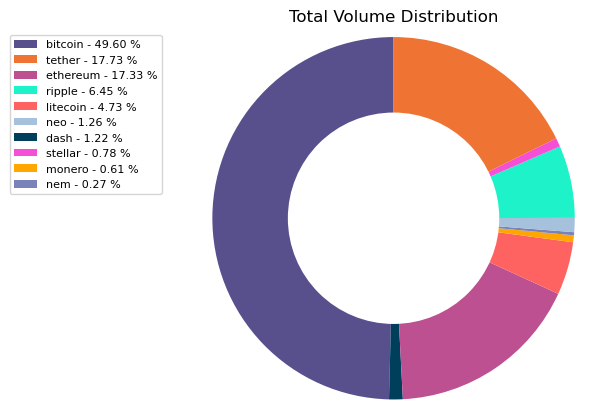

In [52]:
fig , ax = plt.subplots(figsize = (5,5), dpi = 100)
ax.title.set_text('Total Volume Distribution')
ax.title.set_color('#000000')
porcent = 100.*z['volume']/z['volume'].sum()

patches, texts = ax.pie(z['volume'], colors= ['#58508D', '#003F5C', '#BC5090', '#FF6361','#FFA600','#7982B9','#A5C1DC','#1df2c9','#F550D5','#ef7433'], startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(z.index, porcent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, z['volume']),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, bbox_to_anchor=(-0.1, 1.),
           fontsize=8)
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.show()

### Data Bining

In [53]:
df.head()

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
0,bitcoin,BTC,Bitcoin,2013-04-28,1,135.30,135.98,132.10,134.21,0.0,1.488567e+09,0.5438,3.88
1,bitcoin,BTC,Bitcoin,2013-04-29,1,134.44,147.49,134.00,144.54,0.0,1.603769e+09,0.7813,13.49
2,bitcoin,BTC,Bitcoin,2013-04-30,1,144.00,146.93,134.05,139.00,0.0,1.542813e+09,0.3843,12.88
3,bitcoin,BTC,Bitcoin,2013-05-01,1,139.00,139.89,107.72,116.99,0.0,1.298955e+09,0.2882,32.17
4,bitcoin,BTC,Bitcoin,2013-05-02,1,116.38,125.60,92.28,105.21,0.0,1.168517e+09,0.3881,33.32


In [54]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].volume,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='volume')
fig.show()

In [55]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].high,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='High Price')
fig.show()

In [56]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].low,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='Low Price')
fig.show()

In [57]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].open,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='Open Price')
fig.show()

In [58]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].close,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='Close Price')
fig.show()

In [59]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].market,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='Market')
fig.show()

In [60]:
fig = px.scatter(df, x = df[df['slug'] == 'bitcoin'].date, y = df[df['slug'] == 'bitcoin'].spread,
                  height = 400, width = 800,color_discrete_sequence=[palet[0]])
fig.update_layout(xaxis_title = 'date', yaxis_title='Spread')
fig.show()

In [61]:
df_list2 = ['litecoin','monero','stellar','ripple','nem','dash','ethereum','neo']
palet2 = ['#33246f','#1df2c9','#c245be','#ef7433','#73C6B6','#A93226','#5ADCE3','#F550D5','#000000']

In [62]:
df.head()

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
0,bitcoin,BTC,Bitcoin,2013-04-28,1,135.30,135.98,132.10,134.21,0.0,1.488567e+09,0.5438,3.88
1,bitcoin,BTC,Bitcoin,2013-04-29,1,134.44,147.49,134.00,144.54,0.0,1.603769e+09,0.7813,13.49
2,bitcoin,BTC,Bitcoin,2013-04-30,1,144.00,146.93,134.05,139.00,0.0,1.542813e+09,0.3843,12.88
3,bitcoin,BTC,Bitcoin,2013-05-01,1,139.00,139.89,107.72,116.99,0.0,1.298955e+09,0.2882,32.17
4,bitcoin,BTC,Bitcoin,2013-05-02,1,116.38,125.60,92.28,105.21,0.0,1.168517e+09,0.3881,33.32


In [63]:
df_list2 = ['litecoin','monero','stellar','ripple','nem','dash','ethereum','neo']
df2 = df
df2 = df2.loc[df2['slug'].isin(df_list2)].reset_index(drop=True)
df2 = df2.groupby('date').sum()
df2.head()

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2013-04-28,7,4.30,4.40,4.18,4.35,0.0,74636938.0,0.7727,0.22
2013-04-29,7,4.37,4.57,4.23,4.38,0.0,75388964.0,0.4412,0.34
2013-04-30,7,4.40,4.57,4.17,4.30,0.0,74020918.0,0.3250,0.40
2013-05-01,7,4.29,4.36,3.52,3.80,0.0,65604596.0,0.3333,0.84
2013-05-02,7,3.78,4.04,3.01,3.37,0.0,58287979.0,0.3495,1.03


In [64]:
df4 = df
df4 = df4.loc[df4['slug'].isin(df_list2)].reset_index(drop=True)
dff = df4.groupby('date').sum()
dff.head()


,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2013-04-28,7,4.30,4.40,4.18,4.35,0.0,74636938.0,0.7727,0.22
2013-04-29,7,4.37,4.57,4.23,4.38,0.0,75388964.0,0.4412,0.34
2013-04-30,7,4.40,4.57,4.17,4.30,0.0,74020918.0,0.3250,0.40
2013-05-01,7,4.29,4.36,3.52,3.80,0.0,65604596.0,0.3333,0.84
2013-05-02,7,3.78,4.04,3.01,3.37,0.0,58287979.0,0.3495,1.03


In [65]:
df3 = df[df['slug'].isin(df_list2)]
df3[df3['date']>='2017-06-01'].head(20)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
3439,ripple,XRP,XRP,2017-06-01,2,0.243946,0.336797,0.243946,0.333657,588819008.0,1.288640e+10,0.9662,0.09
3440,ripple,XRP,XRP,2017-06-02,2,0.333645,0.335809,0.290710,0.303448,293676992.0,1.171968e+10,0.2824,0.05
3441,ripple,XRP,XRP,2017-06-03,2,0.300460,0.310863,0.277563,0.294580,155454000.0,1.137718e+10,0.5110,0.03
3442,ripple,XRP,XRP,2017-06-04,2,0.298386,0.313944,0.277185,0.299413,153488000.0,1.156384e+10,0.6047,0.04
3443,ripple,XRP,XRP,2017-06-05,2,0.299862,0.302394,0.284600,0.294003,78433504.0,1.135489e+10,0.5284,0.02
3444,ripple,XRP,XRP,2017-06-06,2,0.294028,0.294537,0.276248,0.284548,132720000.0,1.098973e+10,0.4538,0.02
3445,ripple,XRP,XRP,2017-06-07,2,0.284677,0.298379,0.278874,0.279783,145839008.0,1.080569e+10,0.0466,0.02
3446,ripple,XRP,XRP,2017-06-08,2,0.280902,0.298570,0.276441,0.289678,103152000.0,1.111520e+10,0.5982,0.02
3447,ripple,XRP,XRP,2017-06-09,2,0.289695,0.299493,0.285884,0.286019,102482000.0,1.096207e+10,0.0099,0.01
3448,ripple,XRP,XRP,2017-06-10,2,0.285806,0.288991,0.257879,0.260874,156720992.0,9.998356e+09,0.0963,0.03


#### Volume

In [66]:
df4[df4['date']>'2018-01-01'].volume
dff[dff.index>'2018-01-01'].volume.head(20)

date
2018-01-02    1.183242e+10
2018-01-03    1.736673e+10
2018-01-04    2.009621e+10
2018-01-05    1.629791e+10
2018-01-06    1.088235e+10
2018-01-07    1.018080e+10
2018-01-08    1.394677e+10
2018-01-09    1.415733e+10
2018-01-10    1.625937e+10
2018-01-11    1.567060e+10
2018-01-12    1.023915e+10
2018-01-13    9.966051e+09
2018-01-14    8.859584e+09
2018-01-15    9.572036e+09
2018-01-16    1.838344e+10
2018-01-17    1.984999e+10
2018-01-18    1.774126e+10
2018-01-19    9.501745e+09
2018-01-20    8.100981e+09
2018-01-21    7.538803e+09
Name: volume, dtype: float64

In [67]:
df4 = df
df4 = df.loc[df['slug'].isin(df_list2)].reset_index(drop=True)
df4[df4['date']>='2017-06-01'].head(20)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
1397,ripple,XRP,XRP,2017-06-01,2,0.243946,0.336797,0.243946,0.333657,588819008.0,1.288640e+10,0.9662,0.09
1398,ripple,XRP,XRP,2017-06-02,2,0.333645,0.335809,0.290710,0.303448,293676992.0,1.171968e+10,0.2824,0.05
1399,ripple,XRP,XRP,2017-06-03,2,0.300460,0.310863,0.277563,0.294580,155454000.0,1.137718e+10,0.5110,0.03
1400,ripple,XRP,XRP,2017-06-04,2,0.298386,0.313944,0.277185,0.299413,153488000.0,1.156384e+10,0.6047,0.04
1401,ripple,XRP,XRP,2017-06-05,2,0.299862,0.302394,0.284600,0.294003,78433504.0,1.135489e+10,0.5284,0.02
1402,ripple,XRP,XRP,2017-06-06,2,0.294028,0.294537,0.276248,0.284548,132720000.0,1.098973e+10,0.4538,0.02
1403,ripple,XRP,XRP,2017-06-07,2,0.284677,0.298379,0.278874,0.279783,145839008.0,1.080569e+10,0.0466,0.02
1404,ripple,XRP,XRP,2017-06-08,2,0.280902,0.298570,0.276441,0.289678,103152000.0,1.111520e+10,0.5982,0.02
1405,ripple,XRP,XRP,2017-06-09,2,0.289695,0.299493,0.285884,0.286019,102482000.0,1.096207e+10,0.0099,0.01
1406,ripple,XRP,XRP,2017-06-10,2,0.285806,0.288991,0.257879,0.260874,156720992.0,9.998356e+09,0.0963,0.03


In [68]:
df4[df4['date']>='2017-06-01'].head(10)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
1397,ripple,XRP,XRP,2017-06-01,2,0.243946,0.336797,0.243946,0.333657,588819008.0,1.288640e+10,0.9662,0.09
1398,ripple,XRP,XRP,2017-06-02,2,0.333645,0.335809,0.290710,0.303448,293676992.0,1.171968e+10,0.2824,0.05
1399,ripple,XRP,XRP,2017-06-03,2,0.300460,0.310863,0.277563,0.294580,155454000.0,1.137718e+10,0.5110,0.03
1400,ripple,XRP,XRP,2017-06-04,2,0.298386,0.313944,0.277185,0.299413,153488000.0,1.156384e+10,0.6047,0.04
1401,ripple,XRP,XRP,2017-06-05,2,0.299862,0.302394,0.284600,0.294003,78433504.0,1.135489e+10,0.5284,0.02
1402,ripple,XRP,XRP,2017-06-06,2,0.294028,0.294537,0.276248,0.284548,132720000.0,1.098973e+10,0.4538,0.02
1403,ripple,XRP,XRP,2017-06-07,2,0.284677,0.298379,0.278874,0.279783,145839008.0,1.080569e+10,0.0466,0.02
1404,ripple,XRP,XRP,2017-06-08,2,0.280902,0.298570,0.276441,0.289678,103152000.0,1.111520e+10,0.5982,0.02
1405,ripple,XRP,XRP,2017-06-09,2,0.289695,0.299493,0.285884,0.286019,102482000.0,1.096207e+10,0.0099,0.01
1406,ripple,XRP,XRP,2017-06-10,2,0.285806,0.288991,0.257879,0.260874,156720992.0,9.998356e+09,0.0963,0.03


In [69]:
import datetime

start_date = datetime.date(2017, 5, 8)
end_date = datetime.date(2018, 11, 29)
delta = datetime.timedelta(days=1)

while (start_date+(14*delta) <= end_date):
    for coin in df_list2:
        coin_vol = df4[(df4['slug']==coin) & (df4['date']>=np.datetime64(start_date-(15*delta))) & (df4['date']<=np.datetime64(start_date+(15*delta)))].sum()['volume']
        coin_vol = coin_vol - df4[(df4['slug']==coin) & (df4['date']==np.datetime64(start_date))].sum()['volume'] 
        coin_vol_mean = coin_vol/30
        df4.at[(df4['slug']==coin) & (df4['date']==np.datetime64(start_date)),'volume'] = coin_vol_mean
    start_date = start_date+delta

In [70]:
df4[df4['date']>='2017-06-01'].head(10)


,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
1397,ripple,XRP,XRP,2017-06-01,2,0.243946,0.336797,0.243946,0.333657,1.724712e+08,1.288640e+10,0.9662,0.09
1398,ripple,XRP,XRP,2017-06-02,2,0.333645,0.335809,0.290710,0.303448,1.663735e+08,1.171968e+10,0.2824,0.05
1399,ripple,XRP,XRP,2017-06-03,2,0.300460,0.310863,0.277563,0.294580,1.681366e+08,1.137718e+10,0.5110,0.03
1400,ripple,XRP,XRP,2017-06-04,2,0.298386,0.313944,0.277185,0.299413,1.677353e+08,1.156384e+10,0.6047,0.04
1401,ripple,XRP,XRP,2017-06-05,2,0.299862,0.302394,0.284600,0.294003,1.908286e+08,1.135489e+10,0.5284,0.02
1402,ripple,XRP,XRP,2017-06-06,2,0.294028,0.294537,0.276248,0.284548,1.984291e+08,1.098973e+10,0.4538,0.02
1403,ripple,XRP,XRP,2017-06-07,2,0.284677,0.298379,0.278874,0.279783,2.004173e+08,1.080569e+10,0.0466,0.02
1404,ripple,XRP,XRP,2017-06-08,2,0.280902,0.298570,0.276441,0.289678,2.033933e+08,1.111520e+10,0.5982,0.02
1405,ripple,XRP,XRP,2017-06-09,2,0.289695,0.299493,0.285884,0.286019,2.110641e+08,1.096207e+10,0.0099,0.01
1406,ripple,XRP,XRP,2017-06-10,2,0.285806,0.288991,0.257879,0.260874,2.121284e+08,9.998356e+09,0.0963,0.03


In [71]:
dff2 = df4.groupby('date').sum()
dff2.head()

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2013-04-28,7,4.30,4.40,4.18,4.35,0.0,74636938.0,0.7727,0.22
2013-04-29,7,4.37,4.57,4.23,4.38,0.0,75388964.0,0.4412,0.34
2013-04-30,7,4.40,4.57,4.17,4.30,0.0,74020918.0,0.3250,0.40
2013-05-01,7,4.29,4.36,3.52,3.80,0.0,65604596.0,0.3333,0.84
2013-05-02,7,3.78,4.04,3.01,3.37,0.0,58287979.0,0.3495,1.03


In [72]:
dff2.head()

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2013-04-28,7,4.30,4.40,4.18,4.35,0.0,74636938.0,0.7727,0.22
2013-04-29,7,4.37,4.57,4.23,4.38,0.0,75388964.0,0.4412,0.34
2013-04-30,7,4.40,4.57,4.17,4.30,0.0,74020918.0,0.3250,0.40
2013-05-01,7,4.29,4.36,3.52,3.80,0.0,65604596.0,0.3333,0.84
2013-05-02,7,3.78,4.04,3.01,3.37,0.0,58287979.0,0.3495,1.03


In [73]:
fig = px.scatter(dff2, x = dff2.index, y = dff2['volume'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='volume')

fig.show()

In [74]:
fig = px.scatter(dff, x = dff.index, y = dff['volume'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='volume')

fig.show()

In [75]:
df4[df4['date'] <= '2018-04-27'].tail(10)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
12103,neo,NEO,NEO,2018-04-18,17,65.71,73.36,65.71,72.84,1.752428e+08,4.734646e+09,0.9320,7.65
12104,neo,NEO,NEO,2018-04-19,17,72.55,74.79,70.96,74.13,1.761951e+08,4.818262e+09,0.8277,3.83
12105,neo,NEO,NEO,2018-04-20,17,74.18,79.47,72.56,79.03,1.758611e+08,5.136904e+09,0.9363,6.91
12106,neo,NEO,NEO,2018-04-21,17,79.10,79.62,71.16,74.99,1.774557e+08,4.874493e+09,0.4527,8.46
12107,neo,NEO,NEO,2018-04-22,17,74.53,77.20,73.00,73.76,1.801003e+08,4.794510e+09,0.1810,4.20
12108,neo,NEO,NEO,2018-04-23,17,73.65,77.80,73.65,76.22,1.813629e+08,4.954573e+09,0.6193,4.15
12109,neo,NEO,NEO,2018-04-24,17,76.29,84.44,76.24,83.01,1.795288e+08,5.395592e+09,0.8256,8.20
12110,neo,NEO,NEO,2018-04-25,17,82.49,82.58,69.03,71.38,1.772612e+08,4.639700e+09,0.1734,13.55
12111,neo,NEO,NEO,2018-04-26,17,71.56,77.24,69.81,77.19,1.794501e+08,5.017044e+09,0.9933,7.43
12112,neo,NEO,NEO,2018-04-27,17,77.02,77.31,72.67,72.67,1.803019e+08,4.723388e+09,0.0000,4.64


#### Market

In [76]:
df_market = df4
dfm = df_market.groupby('date').sum()

In [77]:
df_market[df_market['date'] <= '2018-04-27'].tail(10)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
12103,neo,NEO,NEO,2018-04-18,17,65.71,73.36,65.71,72.84,1.752428e+08,4.734646e+09,0.9320,7.65
12104,neo,NEO,NEO,2018-04-19,17,72.55,74.79,70.96,74.13,1.761951e+08,4.818262e+09,0.8277,3.83
12105,neo,NEO,NEO,2018-04-20,17,74.18,79.47,72.56,79.03,1.758611e+08,5.136904e+09,0.9363,6.91
12106,neo,NEO,NEO,2018-04-21,17,79.10,79.62,71.16,74.99,1.774557e+08,4.874493e+09,0.4527,8.46
12107,neo,NEO,NEO,2018-04-22,17,74.53,77.20,73.00,73.76,1.801003e+08,4.794510e+09,0.1810,4.20
12108,neo,NEO,NEO,2018-04-23,17,73.65,77.80,73.65,76.22,1.813629e+08,4.954573e+09,0.6193,4.15
12109,neo,NEO,NEO,2018-04-24,17,76.29,84.44,76.24,83.01,1.795288e+08,5.395592e+09,0.8256,8.20
12110,neo,NEO,NEO,2018-04-25,17,82.49,82.58,69.03,71.38,1.772612e+08,4.639700e+09,0.1734,13.55
12111,neo,NEO,NEO,2018-04-26,17,71.56,77.24,69.81,77.19,1.794501e+08,5.017044e+09,0.9933,7.43
12112,neo,NEO,NEO,2018-04-27,17,77.02,77.31,72.67,72.67,1.803019e+08,4.723388e+09,0.0000,4.64


In [78]:
dfm[dfm.index <= '2018-04-27'].tail(10)

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2018-04-18,73,1261.936338,1395.400755,1260.596338,1388.596144,4.229022e+09,1.091607e+11,7.4531,134.80
2018-04-19,73,1387.311176,1463.907800,1368.015861,1459.805726,4.326707e+09,1.177489e+11,7.1864,95.90
2018-04-20,73,1460.794969,1592.046240,1443.094500,1584.400898,4.326276e+09,1.299072e+11,7.3661,148.95
2018-04-21,73,1585.173273,1592.525157,1460.847575,1533.637443,4.357505e+09,1.254741e+11,4.2396,131.67
2018-04-22,73,1532.759282,1634.336821,1504.253821,1583.024225,4.457045e+09,1.270305e+11,3.0965,130.08
2018-04-23,73,1580.849644,1690.087626,1574.612747,1659.353586,4.508858e+09,1.304750e+11,5.9209,115.47
2018-04-24,73,1660.962997,1800.440936,1658.968784,1784.889884,4.477118e+09,1.417719e+11,6.7824,141.47
2018-04-25,73,1777.772583,1778.124864,1511.674226,1551.226245,4.403277e+09,1.225775e+11,1.2355,266.45
2018-04-26,73,1557.061060,1677.254467,1519.085326,1667.453426,4.436830e+09,1.318565e+11,7.6194,158.17


In [79]:
dfm[dfm.index <= '2018-04-27'].market.tail(10)

date
2018-04-18    1.091607e+11
2018-04-19    1.177489e+11
2018-04-20    1.299072e+11
2018-04-21    1.254741e+11
2018-04-22    1.270305e+11
2018-04-23    1.304750e+11
2018-04-24    1.417719e+11
2018-04-25    1.225775e+11
2018-04-26    1.318565e+11
2018-04-27    1.274855e+11
Name: market, dtype: float64

In [80]:
df_market.loc[df_market['date'] >= '2017-11-27'].head(10)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
1576,ripple,XRP,XRP,2017-11-27,2,0.248305,0.254733,0.247861,0.253927,3.084187e+08,9.807390e+09,0.8827,0.01
1577,ripple,XRP,XRP,2017-11-28,2,0.254037,0.301084,0.253415,0.299152,3.787283e+08,1.155411e+10,0.9595,0.05
1578,ripple,XRP,XRP,2017-11-29,2,0.297867,0.297867,0.239409,0.243064,5.773077e+08,9.387829e+09,0.0625,0.06
1579,ripple,XRP,XRP,2017-11-30,2,0.246433,0.261524,0.229586,0.250878,6.854778e+08,9.689628e+09,0.6667,0.03
1580,ripple,XRP,XRP,2017-12-01,2,0.250352,0.258828,0.239438,0.255699,7.379002e+08,9.875829e+09,0.8386,0.02
1581,ripple,XRP,XRP,2017-12-02,2,0.255656,0.259218,0.250756,0.255492,7.773850e+08,9.867834e+09,0.5597,0.01
1582,ripple,XRP,XRP,2017-12-03,2,0.255530,0.263072,0.247391,0.252558,8.358018e+08,9.754515e+09,0.3295,0.02
1583,ripple,XRP,XRP,2017-12-04,2,0.252919,0.255362,0.247160,0.253571,9.006963e+08,9.814930e+09,0.7816,0.01
1584,ripple,XRP,XRP,2017-12-05,2,0.253598,0.253988,0.245234,0.246101,9.507238e+08,9.533742e+09,0.0990,0.01
1585,ripple,XRP,XRP,2017-12-06,2,0.245416,0.245705,0.227742,0.232544,1.086372e+09,9.008556e+09,0.2673,0.02


In [81]:
dfm[dfm.index >= '2017-11-27'].head(10)

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2017-11-27,73,1380.321182,1441.483074,1364.938724,1418.320052,3.280613e+09,7.412184e+10,6.2270,76.54
2017-11-28,73,1420.697534,1459.552944,1384.176412,1437.269249,3.618935e+09,7.627269e+10,5.6870,75.38
2017-11-29,73,1438.087686,1696.306438,1329.269802,1391.445774,3.963010e+09,6.809797e+10,0.9573,367.04
2017-11-30,73,1402.150386,1616.942346,1337.433705,1536.020426,4.230775e+09,7.174360e+10,5.0980,279.50
2017-12-01,73,1533.838019,1608.069858,1470.175164,1590.435153,4.407653e+09,7.524014e+10,7.2375,137.90
2017-12-02,73,1590.945750,1624.637007,1546.129979,1580.861630,4.636666e+09,7.519120e+10,3.7919,78.51
2017-12-03,73,1581.740879,1645.155765,1521.203286,1573.277508,4.916415e+09,7.548785e+10,3.3526,123.96
2017-12-04,73,1574.849533,1610.951352,1517.690334,1601.497065,5.248962e+09,7.693988e+10,7.2261,93.26
2017-12-05,73,1603.036754,1673.961363,1562.093359,1631.010953,5.569904e+09,7.707274e+10,3.3535,111.87


In [82]:
dfm[dfm.index >= '2017-11-27'].market.head(10)

date
2017-11-27    7.412184e+10
2017-11-28    7.627269e+10
2017-11-29    6.809797e+10
2017-11-30    7.174360e+10
2017-12-01    7.524014e+10
2017-12-02    7.519120e+10
2017-12-03    7.548785e+10
2017-12-04    7.693988e+10
2017-12-05    7.707274e+10
2017-12-06    7.280933e+10
Name: market, dtype: float64

In [83]:
import datetime

start_date = datetime.date(2017, 11, 27)
end_date = datetime.date(2018, 4, 27)
delta = datetime.timedelta(days=1)

while (start_date+(2*delta) <= end_date):
    for coin in df_list2:
        coin_cap = df_market[(df_market['slug']==coin) & (df_market['date']>=np.datetime64(start_date-(3*delta))) & (df_market['date']<=np.datetime64(start_date+(3*delta)))].sum()['market']
        coin_cap = coin_cap - df_market[(df_market['slug']==coin) & (df_market['date']==np.datetime64(start_date))].sum()['market'] 
        coin_cap_mean = coin_cap/6
        df_market.at[(df_market['slug']==coin) & (df_market['date']==np.datetime64(start_date)),'market'] = coin_cap_mean
    start_date = start_date+delta

In [84]:
dfm2 = df_market.groupby('date').sum()

In [85]:
df_market[df_market['date'] <= '2018-04-27'].tail(10)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
12103,neo,NEO,NEO,2018-04-18,17,65.71,73.36,65.71,72.84,1.752428e+08,4.681858e+09,0.9320,7.65
12104,neo,NEO,NEO,2018-04-19,17,72.55,74.79,70.96,74.13,1.761951e+08,4.746375e+09,0.8277,3.83
12105,neo,NEO,NEO,2018-04-20,17,74.18,79.47,72.56,79.03,1.758611e+08,4.773896e+09,0.9363,6.91
12106,neo,NEO,NEO,2018-04-21,17,79.10,79.62,71.16,74.99,1.774557e+08,4.891134e+09,0.4527,8.46
12107,neo,NEO,NEO,2018-04-22,17,74.53,77.20,73.00,73.76,1.801003e+08,4.900212e+09,0.1810,4.20
12108,neo,NEO,NEO,2018-04-23,17,73.65,77.80,73.65,76.22,1.813629e+08,4.936263e+09,0.6193,4.15
12109,neo,NEO,NEO,2018-04-24,17,76.29,84.44,76.24,83.01,1.795288e+08,4.851290e+09,0.8256,8.20
12110,neo,NEO,NEO,2018-04-25,17,82.49,82.58,69.03,71.38,1.772612e+08,4.902791e+09,0.1734,13.55
12111,neo,NEO,NEO,2018-04-26,17,71.56,77.24,69.81,77.19,1.794501e+08,5.017044e+09,0.9933,7.43
12112,neo,NEO,NEO,2018-04-27,17,77.02,77.31,72.67,72.67,1.803019e+08,4.723388e+09,0.0000,4.64


In [86]:
dfm2[dfm2.index <= '2018-04-27'].tail(10)

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2018-04-18,73,1261.936338,1395.400755,1260.596338,1388.596144,4.229022e+09,1.146183e+11,7.4531,134.80
2018-04-19,73,1387.311176,1463.907800,1368.015861,1459.805726,4.326707e+09,1.185222e+11,7.1864,95.90
2018-04-20,73,1460.794969,1592.046240,1443.094500,1584.400898,4.326276e+09,1.210219e+11,7.3661,148.95
2018-04-21,73,1585.173273,1592.525157,1460.847575,1533.637443,4.357505e+09,1.255733e+11,4.2396,131.67
2018-04-22,73,1532.759282,1634.336821,1504.253821,1583.024225,4.457045e+09,1.266570e+11,3.0965,130.08
2018-04-23,73,1580.849644,1690.087626,1574.612747,1659.353586,4.508858e+09,1.282430e+11,5.9209,115.47
2018-04-24,73,1660.962997,1800.440936,1658.968784,1784.889884,4.477118e+09,1.270655e+11,6.7824,141.47
2018-04-25,73,1777.772583,1778.124864,1511.674226,1551.226245,4.403277e+09,1.293901e+11,1.2355,266.45
2018-04-26,73,1557.061060,1677.254467,1519.085326,1667.453426,4.436830e+09,1.318565e+11,7.6194,158.17


In [87]:
dfm2[dfm2.index <= '2018-04-27'].market.tail(10)

date
2018-04-18    1.146183e+11
2018-04-19    1.185222e+11
2018-04-20    1.210219e+11
2018-04-21    1.255733e+11
2018-04-22    1.266570e+11
2018-04-23    1.282430e+11
2018-04-24    1.270655e+11
2018-04-25    1.293901e+11
2018-04-26    1.318565e+11
2018-04-27    1.274855e+11
Name: market, dtype: float64

In [88]:
df_market.loc[df_market['date'] >= '2017-11-27'].head(10)

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
1576,ripple,XRP,XRP,2017-11-27,2,0.248305,0.254733,0.247861,0.253927,3.084187e+08,9.906425e+09,0.8827,0.01
1577,ripple,XRP,XRP,2017-11-28,2,0.254037,0.301084,0.253415,0.299152,3.787283e+08,9.702987e+09,0.9595,0.05
1578,ripple,XRP,XRP,2017-11-29,2,0.297867,0.297867,0.239409,0.243064,5.773077e+08,9.775462e+09,0.0625,0.06
1579,ripple,XRP,XRP,2017-11-30,2,0.246433,0.261524,0.229586,0.250878,6.854778e+08,9.813842e+09,0.6667,0.03
1580,ripple,XRP,XRP,2017-12-01,2,0.250352,0.258828,0.239438,0.255699,7.379002e+08,9.788262e+09,0.8386,0.02
1581,ripple,XRP,XRP,2017-12-02,2,0.255656,0.259218,0.250756,0.255492,7.773850e+08,9.746792e+09,0.5597,0.01
1582,ripple,XRP,XRP,2017-12-03,2,0.255530,0.263072,0.247391,0.252558,8.358018e+08,9.617687e+09,0.3295,0.02
1583,ripple,XRP,XRP,2017-12-04,2,0.252919,0.255362,0.247160,0.253571,9.006963e+08,9.387835e+09,0.7816,0.01
1584,ripple,XRP,XRP,2017-12-05,2,0.253598,0.253988,0.245234,0.246101,9.507238e+08,9.359992e+09,0.0990,0.01
1585,ripple,XRP,XRP,2017-12-06,2,0.245416,0.245705,0.227742,0.232544,1.086372e+09,9.374062e+09,0.2673,0.02


In [89]:
dfm2[dfm2.index >= '2017-11-27'].head(10)

,ranknow,open,high,low,close,volume,market,close_ratio,spread
date,,,,,,,,,
2017-11-27,73,1380.321182,1441.483074,1364.938724,1418.320052,3.280613e+09,7.186066e+10,6.2270,76.54
2017-11-28,73,1420.697534,1459.552944,1384.176412,1437.269249,3.618935e+09,7.184797e+10,5.6870,75.38
2017-11-29,73,1438.087686,1696.306438,1329.269802,1391.445774,3.963010e+09,7.299511e+10,0.9573,367.04
2017-11-30,73,1402.150386,1616.942346,1337.433705,1536.020426,4.230775e+09,7.377049e+10,5.0980,279.50
2017-12-01,73,1533.838019,1608.069858,1470.175164,1590.435153,4.407653e+09,7.437208e+10,7.2375,137.90
2017-12-02,73,1590.945750,1624.637007,1546.129979,1580.861630,4.636666e+09,7.510636e+10,3.7919,78.51
2017-12-03,73,1581.740879,1645.155765,1521.203286,1573.277508,4.916415e+09,7.501181e+10,3.3526,123.96
2017-12-04,73,1574.849533,1610.951352,1517.690334,1601.497065,5.248962e+09,7.443772e+10,7.2261,93.26
2017-12-05,73,1603.036754,1673.961363,1562.093359,1631.010953,5.569904e+09,7.508254e+10,3.3535,111.87


In [90]:
dfm2[dfm2.index >= '2017-11-27'].market.head(10)

date
2017-11-27    7.186066e+10
2017-11-28    7.184797e+10
2017-11-29    7.299511e+10
2017-11-30    7.377049e+10
2017-12-01    7.437208e+10
2017-12-02    7.510636e+10
2017-12-03    7.501181e+10
2017-12-04    7.443772e+10
2017-12-05    7.508254e+10
2017-12-06    7.658836e+10
Name: market, dtype: float64

In [101]:
fig = px.scatter(dfm2, x = dfm2.index, y = dfm2['market'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='Market Price')

fig.show()

In [102]:
fig = px.scatter(df2, x = df2.index, y = df2['high'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='High Price')

fig.show()

In [103]:
fig = px.scatter(df2, x = df2.index, y = df2['low'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='low')

fig.show()

In [94]:
fig = px.scatter(df2, x = df2.index, y = df2['spread'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='spread')

fig.show()

In [104]:
fig = px.scatter(df2, x = df2.index, y = df2['open'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='Open Price')

fig.show()

In [96]:
fig = px.scatter(df2, x = df2.index, y = df2['close'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='Close Price')

fig.show()

In [97]:
fig = px.scatter(df2, x = df2.index, y = df2['market'],
                  height = 400, width = 800,color_discrete_sequence=['#23CBBF'])
fig.update_layout(xaxis_title = 'date', yaxis_title='Market Capitalization')

fig.show()

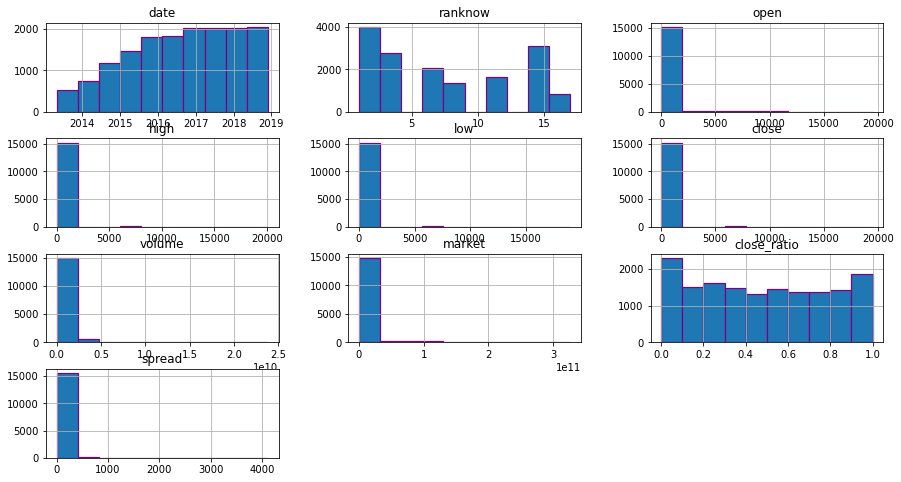

In [99]:
df.hist(edgecolor = 'purple', linewidth = 1.2, figsize = (15, 8))
plt.show()


In [ ]:
fig = px.histogram(df, x='slug', y='volume')
fig.show()                                                                                   


In [100]:
df

,slug,symbol,name,date,ranknow,open,high,low,close,volume,market,close_ratio,spread
0,bitcoin,BTC,Bitcoin,2013-04-28,1,135.30,135.98,132.10,134.21,0.0,1.488567e+09,0.5438,3.88
1,bitcoin,BTC,Bitcoin,2013-04-29,1,134.44,147.49,134.00,144.54,0.0,1.603769e+09,0.7813,13.49
2,bitcoin,BTC,Bitcoin,2013-04-30,1,144.00,146.93,134.05,139.00,0.0,1.542813e+09,0.3843,12.88
3,bitcoin,BTC,Bitcoin,2013-05-01,1,139.00,139.89,107.72,116.99,0.0,1.298955e+09,0.2882,32.17
4,bitcoin,BTC,Bitcoin,2013-05-02,1,116.38,125.60,92.28,105.21,0.0,1.168517e+09,0.3881,33.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15735,neo,NEO,NEO,2018-11-25,17,7.48,7.95,6.73,7.71,168973000.0,5.012066e+08,0.8033,1.22
15736,neo,NEO,NEO,2018-11-26,17,7.69,7.88,6.89,7.14,129336000.0,4.638166e+08,0.2525,0.99
15737,neo,NEO,NEO,2018-11-27,17,7.12,7.30,6.78,7.26,126595000.0,4.718519e+08,0.9231,0.52
15738,neo,NEO,NEO,2018-11-28,17,7.25,8.73,7.25,8.39,175504000.0,5.451414e+08,0.7703,1.48


In [ ]:
df['volume'].value_counts()

### Data Transformation

In [ ]:
pre_df = df

In [ ]:
spr_bin = pre_df
for ind in range(len(spr_bin)):
    spr_bin.loc[ind, 'difference'] = spr_bin.loc[ind, 'close'] - spr_bin.loc[ind, 'open']


In [ ]:
spr_bin

In [ ]:
print(spr_bin['difference'].min())
spr_bin['difference'].max()

In [ ]:
cut_labels_2 = ['DEC','INC']
cut_bins = [-2346, 0, 3634]
spr_bin['status'] = pd.cut(spr_bin['difference'], bins=cut_bins, labels=cut_labels_2)


In [ ]:
spr_bin.groupby('date').mean()

In [ ]:

df

In [ ]:
spr_bin